## SIRD Model Simulation

### Statistical Modeling and Analysis with Python

Krutal and Faiza

In [2]:
# import relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns
from scipy.stats import gamma, norm, poisson
import scipy.stats as st

prng = np.random.default_rng()

#### Part 1: Determine and create an appropriate liklihood model given data

Let y_t = I_obs(t), be the observed number of infected individuals on day t. This is the one of the data points present in the file case_data.csv.

Use the Normal distribution to model the likelihood of of observing y_i on day i

Use u = {beta, gamma, kappa, sigma}

In [3]:
#define parameters respective upper and lower bounds 

# Bounds for parameter beta
beta_0, beta_f = 0.16, 0.25872 

# Bounds for parameter gamma
gamma_0, gamma_f = 0.02, 0.09719

# Bounds for parameter 
kappa_0, kappa_f = 0, 0.02258

# Bounds for parameter sigma  
sigma_0, sigma_f = 0.0, 1000

bounds_p    = [(beta_0, beta_f), (gamma_0, gamma_f), (kappa_0, kappa_f), (sigma_0, sigma_f)]
range_p     = np.array([(beta_f - beta_0), (gamma_f - gamma_0), (kappa_f - kappa_0), (sigma_f - sigma_0)])
init_val_p  = np.array([beta_0, gamma_0, kappa_0, sigma_0])  # initialize the first valueas the minimums of each parameter

# Maximum value of displacement of each parameter for the random walk
disp = np.array([0.01,0.005,0.005,15])

# Constants
sqrt_two_pi = math.sqrt(2.0*math.pi)

In [4]:
# Pick a random point in the 4D parameter space: u: {beta, gamma, kappa, sigma}

prng = np.random.default_rng()
def get_next_pos ():
    r1 = (range_p * prng.random(size = 4)) + init_val_p   
    # note how range_p, init_val_p are indexed 
    # so that each rand_value generated corresponds to the appropriate parameter
    return r1

In [5]:
# Pick a new state by taking a step in a random direction from current position
# Note that u_curr and u_new are 4D arrays, each index holding a parameter of interest (this include the paramter sigma for our normal distribution liklihood)

def get_next_pos_rw (u_cur):
    u_new = np.copy(u_cur)
    # Get new position
    displacements = disp*prng.uniform(low = -1, high = 1, size = 4)
    return u_new + displacements

# Checks if the newly generated vector u, is within the bounds of the parameter space
def in_bounds ( u ):
    for i,pos in enumerate(u):
        if (pos<bounds_p[i][0]) or (pos>bounds_p[i][1]):
            return False
    return True

In [6]:
from scipy.integrate import solve_ivp

# Parameters of simulation
N = 10000 # Population

tmax = 50 # No. of days to simulate

def sird_model ( t, z, beta, gamma, kappa ):

    s, i, r, d = z

    eq01 = -(beta * s * i)/N
    eq02 = (beta * s * i)/N - (gamma*i) - (kappa*i)
    eq03 = gamma * i
    eq04 = kappa * i

    return np.array([eq01, eq02, eq03, eq04])

# Initial condition
i0 = 3
z0 = np.array([N - i0, i0, 0, 0])

t_ser = np.linspace(0,tmax,tmax+1)


In [7]:
# load in prior data into dataframe
df = pd.read_csv('case_data.csv')
df.head()

,t,I(t)
0,0,2
1,1,9
2,2,3
3,3,3
4,4,9


In [8]:

# Returns liklihood function at current state u = {beta, gamma, kappa, sigma} and t time

def get_likelihood_val(u):
    # get matrix from sird with initial cond 

    beta, gamma, kappa, sigma = u
    likelihood = 1

    sol = solve_ivp( sird_model, [0, tmax], z0, \
    args=(beta, gamma, kappa), t_eval = t_ser )

    y_exp =  sol.y[1,:]

    for index, row in df.iterrows(): 
        t = row['t']
        y_i = row['I(t)']

        # value of I(t) extracted from SIRD derivation above
        y_exp_t = y_exp[t]
        
        norm_exp  = ((y_i - y_exp_t)/sigma)
        norm_p = (1/(sigma*sqrt_two_pi)) * math.exp(-(norm_exp**2)/2)
        
        likelihood *= norm_p
    return likelihood

#### Part 2: Determine Prior Distributions for each parameter

For this we can use the Normal Distribution. To determine the appropriate parameters of the Normal distribution, we can compute the mean and standard deviation of the data with respect to each parameter

In [30]:
df2 = pd.read_csv('prior_data_worldwide.csv')
df2.head()
# fix bounds a  to b  by muliplying by a constnt k and readjust this for the bounds above
beta_data = df2['beta'].to_numpy()
beta_mean = np.mean(beta_data)
beta_std= np.std(beta_data)
rv_beta = st.norm(loc = beta_mean, scale = beta_std)

gamma_data = df2['gamma'].to_numpy()
gamma_mean = np.mean(gamma_data)
gamma_std= np.std(gamma_data)
rv_gamma = st.norm(loc = gamma_mean, scale = gamma_std)

kappa_data = df2['Kappa'].to_numpy()
kappa_mean = np.mean(kappa_data)
kappa_std = np.std(kappa_data)
rv_kappa = st.norm(loc = kappa_mean, scale = kappa_std)

rv_sigma = st.norm(loc = 500, scale = 1000) 

# Returns the prior 
def get_prior (u):
    beta1 = 1.00008 * rv_beta.pdf(u[0]) 
    gamma1 = 1.00046 * rv_gamma.pdf(u[1])
    kappa1=  1.00022 * rv_kappa.pdf(u[2])
    sigma1 = rv_sigma.pdf(u[3]) * 1.621

    return beta1*gamma1*kappa1*sigma1


#### Part 3: Determine Posterior Distribution

In [28]:
# returns the posterior

def get_pi_val (u):
    prior = get_prior(u)
    likelihood = get_likelihood_val(u)
    return prior*likelihood

#### Part 4: MCMC Loop

In [13]:
# Simulation parameters
nsteps = 25000 # Number of Monte Carlo steps

# Initial state in parameter space
u_cur = [0.2,0.05,0.01,15]

# Counters
cnt, acc_cnt = 0, 0

# lists that will hold time series data 
beta_cum, gamma_cum, kappa_cum, sig_cum = [], [], [], []

# Rolling estimate of the parameters
est = np.zeros(4)

In [14]:
# Main MC loop
for istep in range(nsteps):

    # Compute pi at current u
    pi_cur = get_pi_val(u_cur)
    print(pi_cur)
    # Propose a new u
    u_new = get_next_pos_rw(u_cur)

    # Compute pi at new u
    pi_new = get_pi_val(u_new)
    print(pi_new)
    # Compute acceptance factor
    ## Add code Step 6 ##
    acc_factor = pi_new / pi_cur

    # Ratio of proposal probabilities is 1 

    if not in_bounds(u_new):
        # Posterior prob. is 0 at u_new
        acc_factor = 0
        
    # Accept/Reject proposal

    if (prng.random() <= acc_factor):

        # Update position ##
        u_cur = u_new
        
        # Keep track of number of acceptances
        acc_cnt += 1

    # Time series of parameters
    beta_cum.append(u_cur[0])  
    gamma_cum.append(u_cur[1])
    kappa_cum.append(u_cur[2])
    sig_cum.append(u_cur[3])
        
    # Compute estimate every 10 steps
    if ((istep > (nsteps)//2) and (istep%10==0)):
        est = est + u_cur
        cnt += 1
    print(acc_factor)

beta 24.10892298036069
gamma 26.733902527851484
kappa 119.39670040807934
prior: 44.24325958253729
liklihood: 1.252551819554794e-301
5.541697529314216e-300
beta 30.438888352626254
gamma 33.931057933500995
kappa 52.00393271511622
prior: 30.66784465672133
liklihood: 0.0
0.0
0.0
beta 24.10892298036069
gamma 26.733902527851484
kappa 119.39670040807934
prior: 44.24325958253729
liklihood: 1.252551819554794e-301
5.541697529314216e-300
beta 13.904745110912904
gamma 17.731521288646675
kappa 129.05298113528082
prior: 18.374820383940154
liklihood: 1.804374608095145e-200
3.3155059329090693e-199
5.982834529259056e+100
beta 13.904745110912904
gamma 17.731521288646675
kappa 129.05298113528082
prior: 18.374820383940154
liklihood: 1.804374608095145e-200
3.3155059329090693e-199
beta 26.331246299588155
gamma 13.837723187411402
kappa 109.67040050806648
prior: 22.91100008122179
liklihood: 0.0
0.0
0.0
beta 13.904745110912904
gamma 17.731521288646675
kappa 129.05298113528082
prior: 18.374820383940154
liklihoo

In [15]:
print(acc_cnt/10000)

0.1093


In [16]:
# computing estimates

beta_Est = np.sum(beta_cum)/nsteps
gamma_Est = np.sum(gamma_cum)/nsteps
kappa_Est = np.sum(kappa_cum)/nsteps
sigma_Est = np.sum(sig_cum)/nsteps

print(beta_Est, gamma_Est,kappa_Est, sigma_Est)

0.21020215453292995 0.058629011582143564 0.011384188945845874 68.43093282995986


In [19]:
#Estimate 90% credibility intervals for the parameters.
def calc_conf(parameter):
    lower_bound = int(0*nsteps)
    upper_bound = int(1*nsteps)
    interval = parameter[lower_bound:upper_bound]
    inter_bounds = (min(interval), max(interval))
    return inter_bounds

beta_bounds = calc_conf(beta_cum)
gamma_bounds = calc_conf(gamma_cum)
kappa_bounds = calc_conf(kappa_cum)
sigma_bounds = calc_conf(sig_cum)

print(beta_bounds, gamma_bounds, kappa_bounds, sigma_bounds)

(0.18399524428270173, 0.22702641540233562) (0.03864487105833573, 0.07624615083277761) (0.0024907473038902187, 0.021172060745898225) (15, 95.38935188897975)


Text(0, 0.5, 'Kappa Estimates')

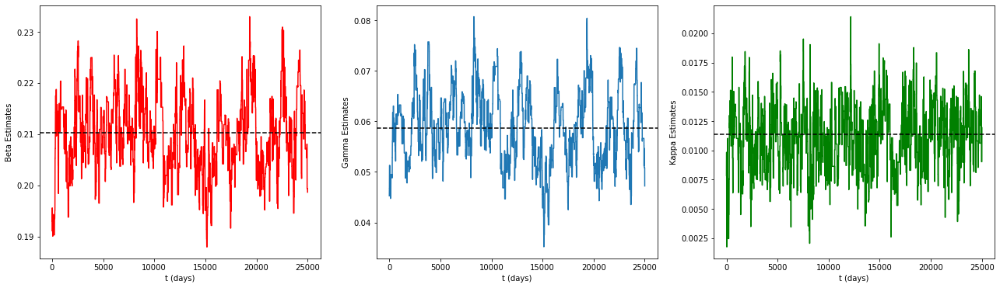

In [41]:
fig = plt.figure(1, figsize=(22,6))
plt.subplot(131)
x = np.linspace(0,nsteps,nsteps)
y = beta_cum
plt.plot(x,y,color='r')
plt.axhline(y= beta_Est, color='k', linestyle='--')
plt.xlabel('t (days)')
plt.ylabel('Beta Estimates')

plt.subplot(132)
x = np.linspace(0,nsteps,nsteps)
y = gamma_cum
plt.plot(x,y)
plt.axhline(y= gamma_Est, color='k', linestyle='--')
plt.xlabel('t (days)')
plt.ylabel('Gamma Estimates')


plt.subplot(133)
x = np.linspace(0,nsteps,nsteps)
y = kappa_cum
plt.plot(x,y,color='g')
plt.axhline(y= kappa_Est, color='k', linestyle='--')
plt.xlabel('t (days)')
plt.ylabel('Kappa Estimates')

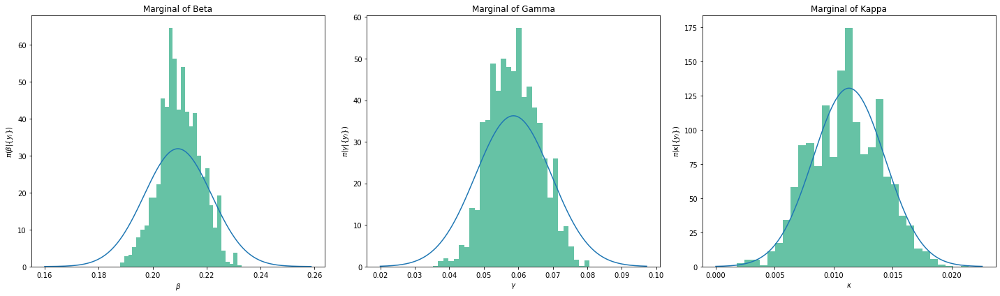

In [42]:
# Plot time series data for beta
fig = plt.figure(1, figsize=(20,6))
plt.subplot(131)
x = np.linspace(beta_0,beta_f, 500)
plt.hist(beta_cum, color = '#66c2a5', bins = 30, density = True)
plt.plot(x,1.00008 * st.norm.pdf(x,beta_mean, beta_std))
plt.ylabel(r'$\pi(\beta|\{y_i\})$')
plt.xlabel(r'$\beta$')
plt.title('Marginal of Beta')
plt.tight_layout()

#plot time series data for gamma
plt.subplot(132)
x = np.linspace(gamma_0,gamma_f, 500)
plt.hist(gamma_cum, color = '#66c2a5', bins = 30, density = True)
plt.plot(x,1.00046 * st.norm.pdf(x,gamma_mean, gamma_std))
plt.ylabel(r'$\pi(\gamma|\{y_i\})$')
plt.xlabel(r'$\gamma$')
plt.title('Marginal of Gamma')
plt.tight_layout()

#plot time series data for kappa
plt.subplot(133)
x = np.linspace(kappa_0,kappa_f, 500)
plt.hist(kappa_cum, color = '#66c2a5', bins = 30, density = True)
plt.plot(x,1.00022 * st.norm.pdf(x,kappa_mean, kappa_std))
plt.title('Marginal of Kappa')
plt.ylabel(r'$\pi(\kappa|\{y_i\})$')
plt.xlabel(r'$\kappa$')
plt.tight_layout()

In [31]:
# part 4: 

# Simulation parameters

n_steps = 100 # Number of Monte Carlo steps

# Initial state in parameter space
u_cur = [0.2,0.05,0.01,15]

# lists that will hold time series data
beta_cum, gamma_cum, kappa_cum, sig_cum = [], [], [], []

# Rolling estimate of the parameters
est = np.zeros(4)

# Main MC loop
for istep in range(nsteps):

    # Compute pi at current u
    pi_cur = get_pi_val(u_cur)

    # Propose a new u
    u_new = get_next_pos_rw(u_cur)

    # Compute pi at new u
    pi_new = get_pi_val(u_new)

    # Compute acceptance factor
    ## Add code Step 6 ##
    acc_factor = pi_new / pi_cur

    # Ratio of proposal probabilities is 1

    if not in_bounds(u_new):
        # Posterior prob. is 0 at u_new
        acc_factor = 0
       
    # Accept/Reject proposal

    if (prng.random() <= acc_factor):

        # Update position ##
        u_cur = u_new
       
        # Keep track of number of acceptances
        acc_cnt += 1


    # Time series of parameters
    beta_cum.append(u_cur[0])
    gamma_cum.append(u_cur[1])
    kappa_cum.append(u_cur[2])
    sig_cum.append(u_cur[3])

In [32]:

#nested list where each element is a 110 dimensional list of days, each initial index is a time series list of I, R, D at each ui, respectiviliy 
I = []
R = []
D = []

for i in range(n_steps):

    # Parameters of simulation
    tmax = 110 # No. of days to simulate
   
    # Value of parameters
    beta_1 = beta_cum[i]
    gamma_1 = gamma_cum[i]
    kappa_1 = kappa_cum[i]

    # Solution is computed at these values of t
    t_ser1 = np.linspace(0,tmax,tmax+1)

    sol = solve_ivp( sird_model, [0, tmax], z0, \
    args=(beta_1, gamma_1, kappa_1), t_eval = t_ser1 )

    # Solution is stored in individual arrays s(t), i(t), r(t), d(t)
    s_of_t = sol.y[0,:]; i_of_t = sol.y[1,:]; r_of_t = sol.y[2,:]; d_of_t = sol.y[3,:];
   
    I.append(i_of_t)
    R.append(r_of_t)
    D.append(d_of_t)

I = np.array(I)
R = np.array(R)
D = np.array(D)

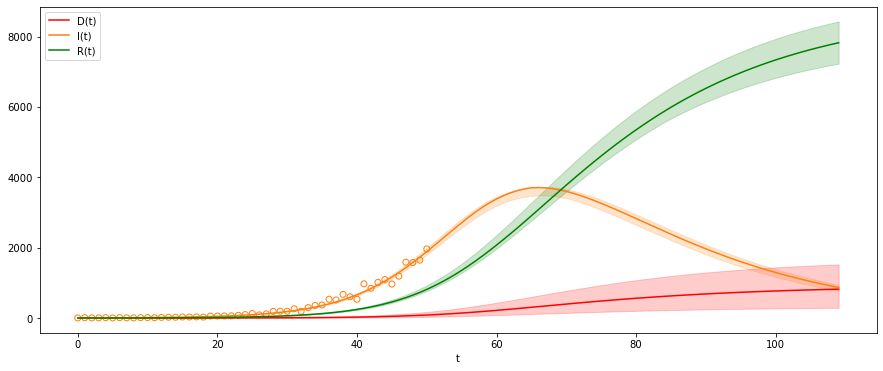

In [33]:
new_I = I.transpose()
new_R = R.transpose()
new_D = D.transpose()


medians_I = []
medians_R = []
medians_D = []

mins_I = []
mins_R = []
mins_D = []

maxs_I = []
maxs_R = []
maxs_D = []


for i in range(tmax):
    medians_I.append(np.median(new_I[i]))
    medians_R.append(np.median(new_R[i]))
    medians_D.append(np.median(new_D[i]))

    mins_I.append(min(new_I[i]))
    mins_R.append(min(new_R[i]))
    mins_D.append(min(new_D[i]))
    
    maxs_I.append(max(new_I[i]))
    maxs_R.append(max(new_R[i]))
    maxs_D.append(max(new_D[i]))

t = np.linspace(0,109,110) ## The lengths are 110 vs 111

fig = plt.figure(1, figsize=(15,6))

plt.plot(t, medians_D, 'r-')
plt.fill_between(t, mins_D, maxs_D, color ='r',alpha=0.2,)

plt.plot(t,medians_I, '-', color = 'tab:orange')
plt.fill_between(t, mins_I, maxs_I, color ='tab:orange',alpha=0.2)

plt.plot(t, medians_R, 'g-')
plt.fill_between(t, mins_R, maxs_R, color = 'g',alpha=0.2)
plt.scatter(df['t'],df['I(t)'], facecolors='none', edgecolors='tab:orange')

plt.xlabel('t')
plt.legend(['D(t)', 'I(t)','R(t)'])




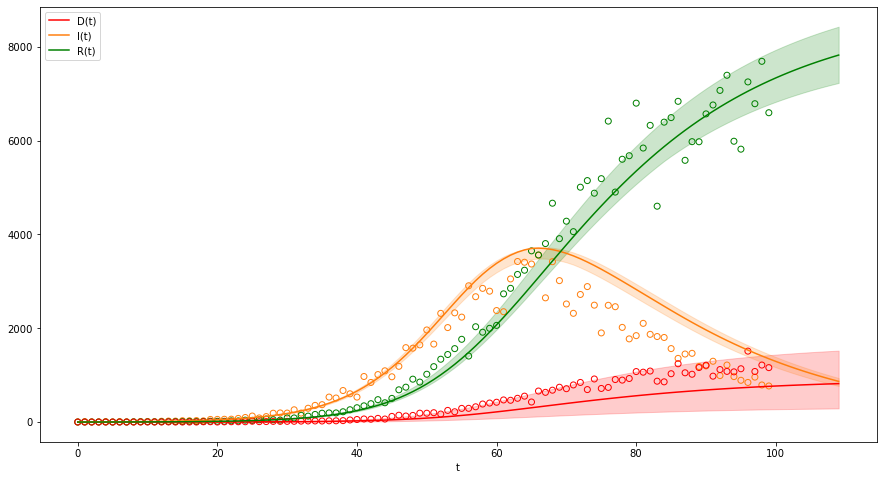

In [34]:
#part5
df = pd.read_csv('test_predictions.csv')
t2 = df['t']
true_I = df['I(t)']
true_R= df['R(t)']
true_D = df['D(t)']

fig = plt.figure(1, figsize=(15,8))
plt.plot(t, medians_D, 'r-')
plt.fill_between(t, mins_D, maxs_D, color ='r',alpha=0.2,)

plt.plot(t,medians_I, '-', color = 'tab:orange')
plt.fill_between(t, mins_I, maxs_I, color ='tab:orange',alpha=0.2)

plt.plot(t, medians_R, 'g-')
plt.fill_between(t, mins_R, maxs_R, color = 'g',alpha=0.2)


plt.scatter(t2,true_I,facecolors='none', edgecolors='tab:orange' )
plt.scatter(t2, true_R, facecolors='none', edgecolors='g')
plt.scatter(t2,true_D, facecolors='none', edgecolors='r')

plt.xlabel('t')
plt.legend(['D(t)', 'I(t)','R(t)'])